## Stable diffusion model exploration 

1. Using SD concepts
2. Using custom loss

## Student submission 

Sijuade Oguntayo sijuade.oguntayo@gmail.com

Sanjana Tule     sanjana.tule@gmail.com

## Libraries

In [1]:
! pip install -q --upgrade transformers diffusers ftfy accelerate

In [2]:
import os
import torch
import PIL
from PIL import Image
from diffusers import StableDiffusionPipeline, DiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
import numpy as np
import cv2
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T
elastic_transformer = T.ElasticTransform(alpha=550.0,sigma=5.0)
import gc
import torch.nn.functional as F

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# configurations
torch_device        = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
height, width       = 512, 512
guidance_scale      = 8
loss_scale          = 200
num_inference_steps = 50
batch_size          = 1

In [4]:
# large or small model

pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipe = DiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16
).to("cuda")

# pretrained_model_name_or_path = "segmind/tiny-sd"
# pipe = DiffusionPipeline.from_pretrained(
#     pretrained_model_name_or_path,
#     torch_dtype=torch.float16,
#     low_cpu_mem_usage = True
# ).to(torch_device)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


## Functions

In [5]:
# functions

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def image_loss(images,loss_type):
    
    if loss_type == 'blue':
        # blue loss
        error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the blue channel
    elif loss_type == 'elastic':
        # elastic loss
        transformed_imgs = elastic_transformer(images) # 2,3,512,512
        error = torch.abs(transformed_imgs - images).mean()    
    elif loss_type == 'symmetry':
        flipped_image = torch.flip(images, [3])
        error = F.mse_loss(images, flipped_image)
    elif loss_type == 'saturation':
        # saturation loss
        transformed_imgs = T.functional.adjust_saturation(images,saturation_factor = 10)
        error = torch.abs(transformed_imgs - images).mean()
    else:
        print("error. Loss not defined")

    return error

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = pipe.vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1) # 0 to 1
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [6]:
def generate_image(seed_no,prompts,loss_type,loss_apply=False):
    
    generator           = torch.manual_seed(seed_no)
    
    # scheduler
    scheduler    = LMSDiscreteScheduler(beta_start = 0.00085, beta_end = 0.012, beta_schedule = "scaled_linear", num_train_timesteps = 1000)
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32)

    # text embeddings of the prompt
    text_input = pipe.tokenizer(prompts, padding='max_length', max_length = pipe.tokenizer.model_max_length, truncation= True, return_tensors="pt")
    input_ids = text_input.input_ids.to(torch_device)

    with torch.no_grad():
        text_embeddings = pipe.text_encoder(text_input.input_ids.to(torch_device))[0]

    max_length = text_input.input_ids.shape[-1]
    uncond_input = pipe.tokenizer(
          [""] * batch_size, padding="max_length", max_length= max_length, return_tensors="pt"
    )

    with torch.no_grad():
        uncond_embeddings = pipe.text_encoder(uncond_input.input_ids.to(torch_device))[0]

    text_embeddings = torch.cat([uncond_embeddings,text_embeddings]) # 2,77,768

    # random latent
    latents = torch.randn(
        (batch_size, pipe.unet.config.in_channels, height// 8, width //8),
        generator = generator,
    ) .to(torch.float16)


    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    for i, t in tqdm(enumerate(scheduler.timesteps), total = len(scheduler.timesteps)):

        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(latent_model_input.to(torch.float16), t, encoder_hidden_states=text_embeddings)["sample"]
            #noise_pred = pipe.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        if loss_apply and i%5 == 0: 
            
            latents = latents.detach().requires_grad_()
            #latents_x0 = scheduler.step(noise_pred,t, latents).pred_original_sample # this line does not work
            latents_x0 = latents - sigma * noise_pred

            # use vae to decode the image
            denoised_images = pipe.vae.decode((1/ 0.18215) * latents_x0).sample / 2 + 0.5 # range(0,1)

            loss = image_loss(denoised_images,loss_type) * loss_scale
            print(f"loss {loss}")
            
            cond_grad = torch.autograd.grad(loss, latents)[0]
            latents = latents.detach() - cond_grad * sigma**2

        latents = scheduler.step(noise_pred,t, latents).prev_sample
        
    return latents

In [7]:
# Load SD concepts
sdconcepts = ['<meeg>', '<midjourney-style>', '<moebius>', ' <Marc_Allante>', '<wlop-style>'] 

pipe.load_textual_inversion("sd-concepts-library/dreams") 
pipe.load_textual_inversion("sd-concepts-library/midjourney-style") 
pipe.load_textual_inversion("sd-concepts-library/moebius") 
pipe.load_textual_inversion("sd-concepts-library/style-of-marc-allante") 
pipe.load_textual_inversion("sd-concepts-library/wlop-style")

# define seeds
seed_list = [2000,2000,500,600,100]

## Prompt

In [13]:
prompt  = """Boy with a cowboy hat in the style of"""

## Images without any loss

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

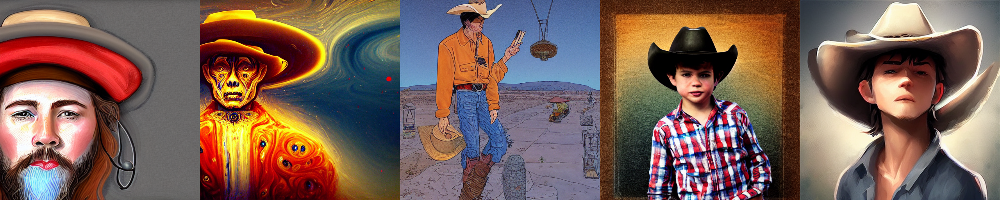

In [14]:
# after loss is applied
latents_collect = [] 
loss_type = 'N/A'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no, prompts,loss_type,loss_apply=False)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

## Images with elastic loss applied every 5 step

  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.01953125
loss 9.4921875
loss 12.6484375
loss 12.2890625
loss 11.7734375
loss 11.9375
loss 11.921875
loss 12.375
loss 13.0
loss 13.578125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 4.98828125
loss 6.7265625
loss 7.25
loss 8.5546875
loss 9.0234375
loss 12.046875
loss 13.171875
loss 11.625
loss 11.53125
loss 11.8984375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 12.484375
loss 13.6015625
loss 16.921875
loss 23.53125
loss 25.640625
loss 29.09375
loss 31.90625
loss 34.875
loss 34.25
loss 38.21875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.0078125
loss 6.390625
loss 9.53125
loss 11.515625
loss 10.2890625
loss 10.9765625
loss 12.1484375
loss 12.890625
loss 14.21875
loss 14.8828125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 9.7265625
loss 11.5703125
loss 14.1328125
loss 18.5
loss 13.890625
loss 14.453125
loss 13.796875
loss 14.4140625
loss 14.3203125
loss 14.4921875


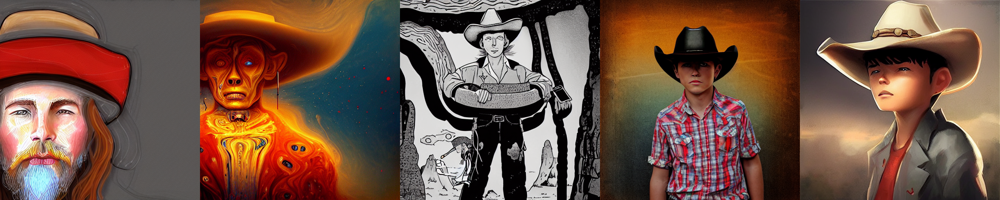

In [15]:
# after loss is applied
latents_collect = []
loss_type = 'elastic'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

## Images with symmetry loss applied every 5 step

  0%|          | 0/50 [00:00<?, ?it/s]

loss 20.109375
loss 44.09375
loss 15.84375
loss 10.2890625
loss 10.1171875
loss 10.046875
loss 9.75
loss 9.6953125
loss 9.7734375
loss 10.0


  0%|          | 0/50 [00:00<?, ?it/s]

loss 13.3046875
loss 22.734375
loss 5.46484375
loss 4.1796875
loss 6.1171875
loss 5.83984375
loss 4.51171875
loss 4.109375
loss 3.96484375
loss 3.966796875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.484375
loss 85.125
loss 75.5
loss 74.3125
loss 80.875
loss 85.6875
loss 84.4375
loss 84.875
loss 83.6875
loss 82.25


  0%|          | 0/50 [00:00<?, ?it/s]

loss 2.255859375
loss 3.619140625
loss 8.96875
loss 8.4140625
loss 5.7421875
loss 4.90234375
loss 5.44921875
loss 5.94921875
loss 6.6484375
loss 7.359375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.8984375
loss 58.5
loss 31.546875
loss 24.484375
loss 18.5
loss 16.84375
loss 15.75
loss 15.4765625
loss 15.4453125
loss 15.53125


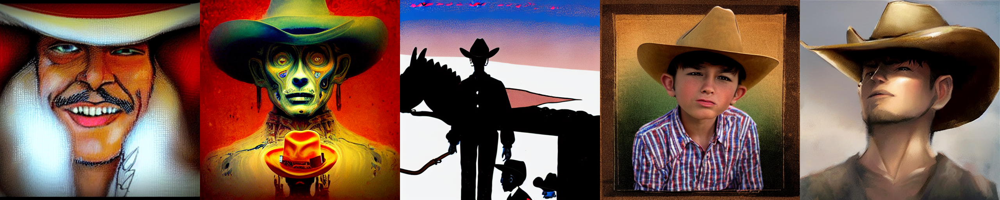

In [16]:
# after loss is applied
latents_collect = []
loss_type = 'symmetry'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

## Images with saturation loss applied every 5 step

  0%|          | 0/50 [00:00<?, ?it/s]

loss 48.8125
loss 32.25
loss 22.640625
loss 20.078125
loss 20.65625
loss 19.71875
loss 18.453125
loss 17.359375
loss 16.8125
loss 16.484375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 42.1875
loss 37.84375
loss 34.125
loss 25.296875
loss 22.828125
loss 21.90625
loss 19.953125
loss 19.125
loss 19.0
loss 19.078125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 57.28125
loss 25.921875
loss 21.96875
loss 21.625
loss 18.671875
loss 19.3125
loss 17.890625
loss 17.65625
loss 17.515625
loss 17.5


  0%|          | 0/50 [00:00<?, ?it/s]

loss 57.625
loss 37.96875
loss 26.125
loss 13.5390625
loss 11.3359375
loss 10.546875
loss 10.171875
loss 10.125
loss 10.3359375
loss 10.78125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 58.75
loss 48.0625
loss 38.6875
loss 34.1875
loss 30.734375
loss 29.03125
loss 28.03125
loss 27.5625
loss 27.390625
loss 27.5625


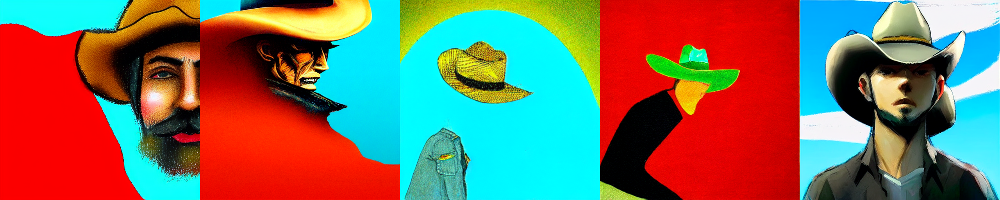

In [17]:
# after loss is applied
latents_collect = []
loss_type = 'saturation'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

## Images with blue loss applied every 5 step

  0%|          | 0/50 [00:00<?, ?it/s]

loss 119.75
loss 42.5
loss 27.515625
loss 25.296875
loss 19.421875
loss 15.890625
loss 13.9140625
loss 12.5859375
loss 11.8515625
loss 11.2578125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 168.0
loss 52.75
loss 34.53125
loss 26.921875
loss 23.078125
loss 21.734375
loss 20.59375
loss 19.71875
loss 19.390625
loss 19.203125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 86.5
loss 57.03125
loss 47.15625
loss 41.15625
loss 37.9375
loss 33.96875
loss 32.65625
loss 31.640625
loss 31.0625
loss 30.8125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 130.0
loss 47.0
loss 28.734375
loss 25.359375
loss 24.0625
loss 22.8125
loss 21.9375
loss 21.28125
loss 21.125
loss 21.34375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 107.625
loss 31.890625
loss 25.125
loss 23.21875
loss 20.484375
loss 22.390625
loss 21.515625
loss 20.78125
loss 20.296875
loss 20.234375


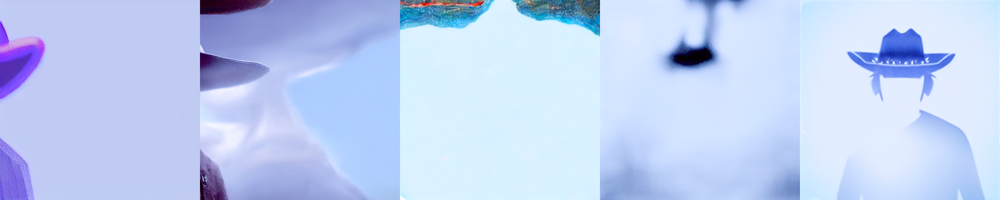

In [18]:
# after loss is applied
latents_collect = []
loss_type = 'blue'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))